# Term-project Final Report

## Deblurring selfies using convolutional auto encoder

## 산업경영공학과 2020103913 김동규

### Before start

[텀프로젝트 제안서]('./term_project_proposal.md')와 [텀프로젝트 중간 보고서]('./2020103913_term_project_mid_term_report.ipynb')에 본 프로젝트의 전체적인 내용, 제작계획, 원리 및 데이터 전처리 과정이 포함되어 있습니다. 참고 부탁드립니다.

이번 최종 보고서에서 설명할 내용은 다음과 같습니다. 

1. 사진 motion blur 처리 및 그 이유
2. 사용한 auto encoder 모델과 설명
3. 실제 사용 방법
4. blurring부터 deblur까지 작동 모습

### 주의사항

이 프로젝트는 여러 라이브러리에 의존성을 가지고 있습니다. 그러한 이유로 라이브러리 간의 버전 충돌 및 미설치 등으로 코드가 잘 작동되지 않을 수 있습니다. 아래는 문제없이 작동이 확인된 라이브러리의 버전입니다.

```
    opencv-python==4.5.1.48
    glob2==0.6
    matplotlib==3.0.3
    numpy==1.16.2
    Pillow==5.4.1
    tqdm==4.60.0
    tensorflow==1.13.1
    Keras==2.3.1
    albumentations==1.0.0
    beautifulsoup4==4.7.1
    scikit-learn==0.20.3
    scipy==1.2.1
    seaborn==0.9.0
```

또한, 본 프로젝트는 linux 18.04 LTS 및 anaconda3와 python 3.7 버전 환경에서만 테스트 되었습니다. 기타 다른 환경에서는 문제가 발생할 수 있음을 알려드립니다. 

### 사진 motion blur 처리

[관련 코드]('./motion_blurring_img.ipynb')

중간 보고서까지는 총 4가지의 blur 방식을 이용하여 데이터에 노이즈를 생성하였습니다. 이러한 방식으로 상당량의 노이즈를 발생시킬 수 있었으나, 이를 그대로 복원하는 auto encoder network를 구현하는 것은 아주 어려웠습니다. 현실적으로 짧은 기간 안에 deblur 기능을 성공적으로 수행할 수 있는 auto encoder 네트워크를 처음부터 디자인하는 것은 불가능하다는 판단을 내려, 기존에 잘 훈련이 되어있는 네트워크를 이용하여 deblur 기능을 수행하고자 하였습니다. 

그 첫 단계로, 먼저 motion blur만을 적용하여 사진을 다시 전처리하였습니다. 위의 코드를 이용하여 손쉽게 이미지에 motion blur를 적용하였습니다. 

### auto encoder를 통한 deblur

위에서 언급했듯이, 여러 데이터를 통하여 미리 훈련된 auto encoder 모델을 그대로 사용하여 deblur 기능을 구현하였습니다. 해당 네트워크에 대한 자세한 내용은 이 [논문](https://jiaya.me/papers/deblur_cvpr19.pdf)을 참고하시기 바랍니다. 또한, 해당 모델의 코드와 pre-trained 모델의 파일은 해당 [git](https://github.com/firenxygao/deblur)에서 가져와 활용하였습니다. 

훈련에 사용한 모델은 3단계의 encoder 단계와 3단계의 decoder 단계로 이루어집니다. 각 단계는 총 3개의 layer들로 이루어져 있습니다. 한 개는 feature extraction을 할 수 있는 layer이며, 나머지 2개의 layer는 nonlinear transformation이 이루어지는 layer입니다.

위 encoder들의 filter가 32개 - 64개 - 128개까지 늘어나며, decoder에서는 반대로 128개 - 64개 - 32개로 줄어들어 마지막에 하나의 filter까지 줄어들어 최종적인 deblur 이미지를 내놓습니다. 또한, 중간에 skip connection을 두 번 활용하여 모든 데이터가 128개의 filter를 가진 latent space까지 가지 않아 원본의 형태를 더 잘 유지할 수 있습니다. 

위의 네트워크를 [GoPro Dataset](https://seungjunnah.github.io/Datasets/gopro)를 통하여 학습하였습니다. 이를 통해 학습한 네트워크는 어떠한 motion blur든지 잘 deblur를 해줄 수 있습니다. 이제 아래 코드를 통하여 실제로 deblur를 해보겠습니다.

먼저 해당 라이브러리를 import합니다.

In [34]:
import glob
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
from tqdm.notebook import tqdm
from utils import visualize_many_images
import tensorflow as tf
from keras import models, layers
from keras import optimizers
from file_prepare import *
import os
import deblur.model as model

랜덤으로 motion blur를 준 이미지들이 있는 디렉토리를 input_path로 설정해줍니다.

In [39]:
deblur = model.DEBLUR(input_path='./motion_blur_test')

그 후, pre-trained 모델이 있는 경로를 입력하여 모델을 빌드합니다. 
github에서 그냥 clone을 할 경우에 모델 데이터가 다운로드되지 않는 경우가 있습니다. 이 경우, zip 파일로 파일을 다운로드 받고 아래 파일 형태와 동일하게 폴더를 만든 후 데이터를 넣어주면 pre-trained 모델을 사용할 수 있습니다.
```
checkpoint
├── alldata
│   ├── deblur_model.data-00000-of-00001
│   ├── deblur_model.index
│   └── deblur_model.meta
└── default
    ├── deblur_model.data-00000-of-00001
    ├── deblur_model.index
    └── deblur_model.meta
 ```



In [41]:
deblur.build('checkpoint/alldata')

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model


이제 해당 모델을 이용해서 실제로 deblur를 진행합니다. 

In [43]:
deblur.test()

Total 36 images for deblurring
0.jpg
22.jpg
34.jpg
21.jpg
28.jpg
26.jpg
11.jpg
8.jpg
29.jpg
23.jpg
14.jpg
17.jpg
27.jpg
5.jpg
24.jpg
15.jpg
6.jpg
33.jpg
25.jpg
19.jpg
31.jpg
1.jpg
20.jpg
13.jpg
30.jpg
4.jpg
9.jpg
12.jpg
35.jpg
3.jpg
2.jpg
7.jpg
16.jpg
18.jpg
10.jpg
32.jpg


아래 사진들은 한 사진에 랜덤으로 motion blur를 적용한 모습입니다. 

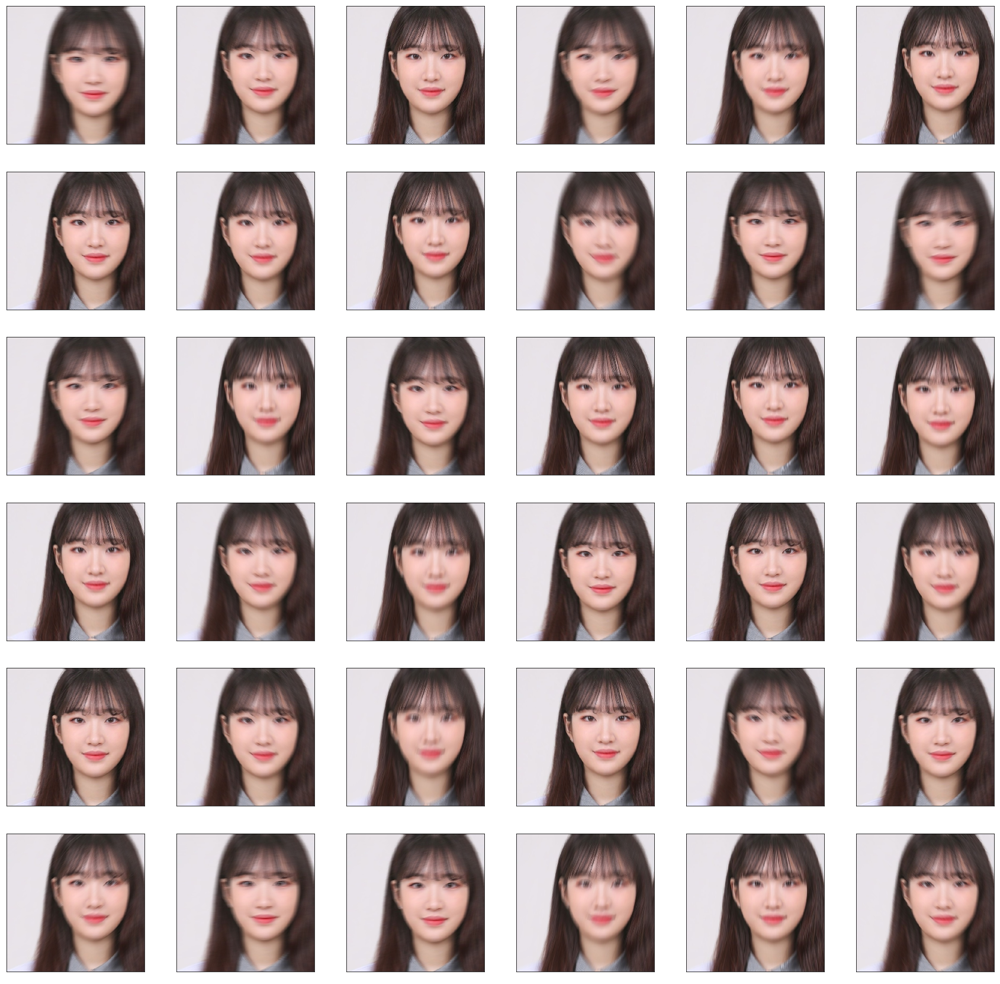

In [44]:
visualize_many_images(glob.glob('./motion_blur_test/*.jpg'))

아래 사진들은 위 과정을 이용하여 deblur를 진행한 모습입니다. motion blur의 정도에 따라 deblur의 정도가 다르지만, 대체로 훌륭하게 deblur가 진행된 모습을 볼 수 있습니다. 

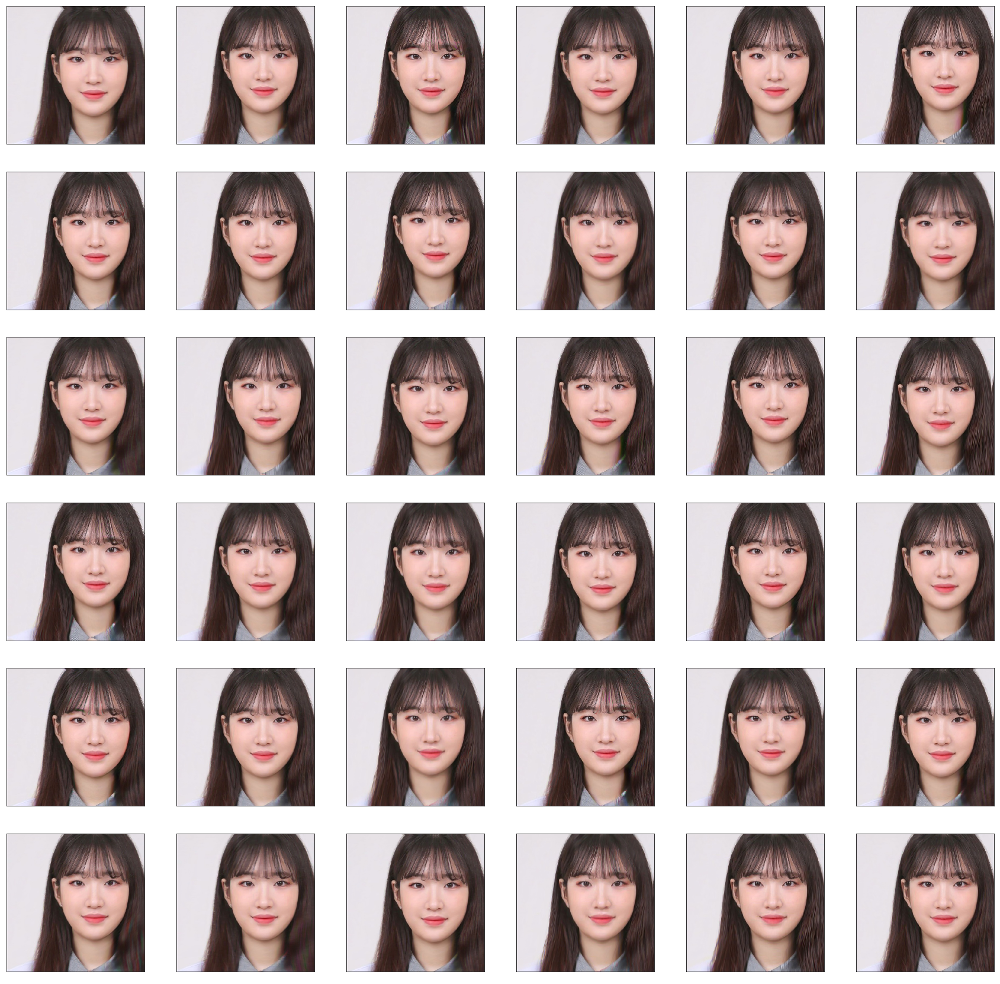

In [45]:
visualize_many_images(glob.glob('./motion_blur_test_res/*.jpg'))

### blrring부터 deblur 까지

[python 코드]('./deblur_process.py')에서 자세한 코드를 확인하시기 바랍니다. 해당 코드가 작동하려면 해당 python 코드가 있는 경로와 같은 경로에 cut_img 폴더와 start_to_end_data 폴더가 있어야 하며, cut_img 폴더 내에는 cut_img0.jpg, cut_img48.jpg와 같은 형태로 저장된 원본 이미지가 있어야만 합니다. 

In [3]:
from deblur_process import process

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
0.jpg
process completed


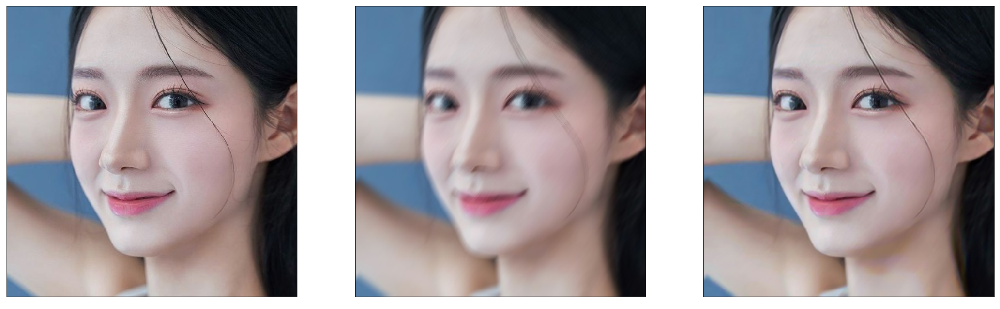

In [8]:
p0 = process(0)
p0.fit()
p0.visualize()

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
4.jpg
process completed


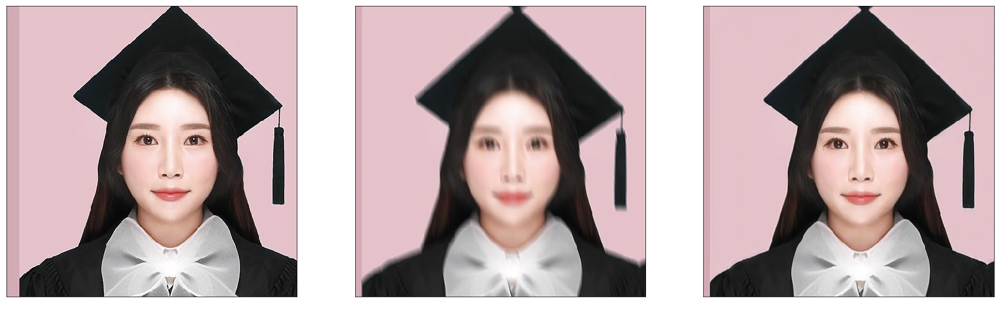

In [4]:
p4 = process(4)
p4.fit()
p4.visualize()

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
7.jpg
process completed


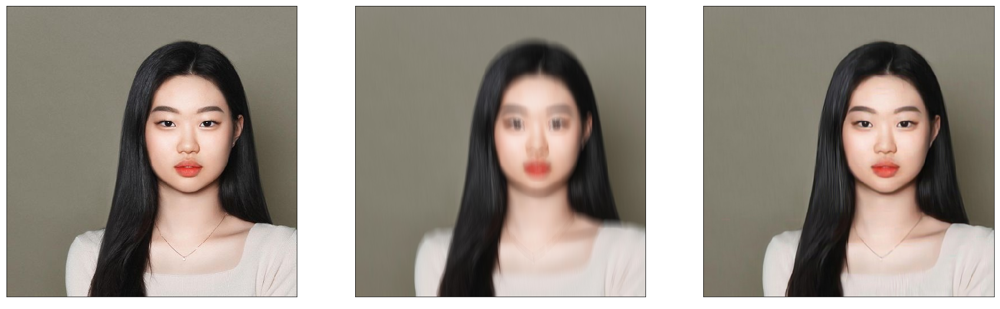

In [7]:
p7 = process(7)
p7.fit()
p7.visualize()

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
8.jpg
process completed


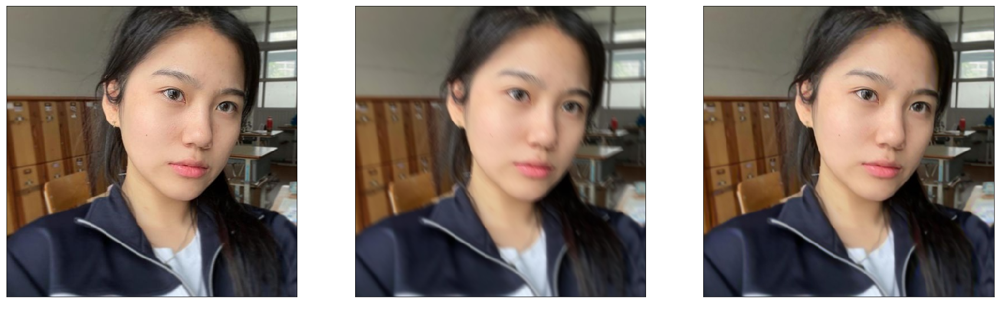

In [10]:
p8 = process(8)
p8.fit()
p8.visualize()

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
9.jpg
process completed


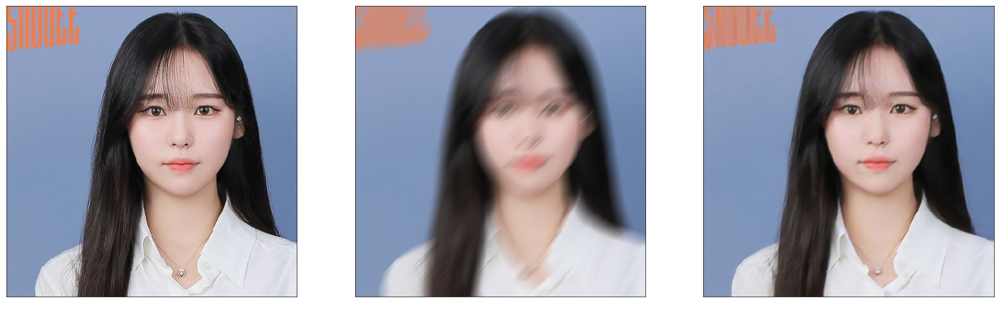

In [11]:
p9 = process(9)
p9.fit()
p9.visualize()

INFO:tensorflow:Restoring parameters from /home/marker/웹파/텀프/deblur/checkpoint/alldata/deblur_model
Total 1 images for deblurring
10.jpg
process completed


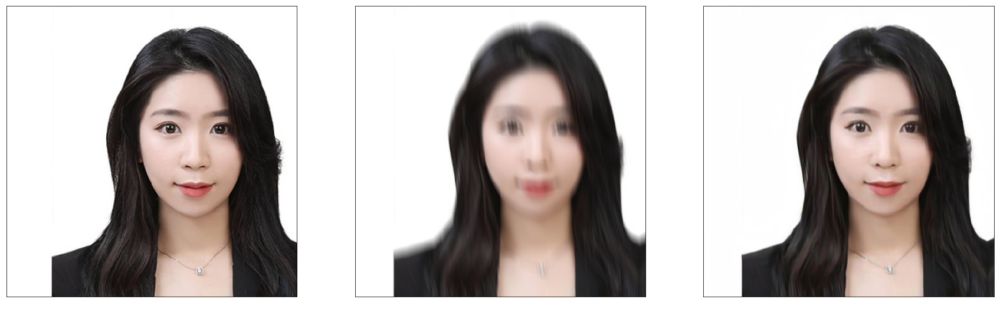

In [13]:
p10 = process(10)
p10.fit()
p10.visualize()